In [144]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6

In [145]:

data = pd.read_csv('AirPassengers.csv')
print(data.head())
print('\n Data Types:')
print(data.dtypes)

     Month  #Passengers
0  1949-01          112
1  1949-02          118
2  1949-03          132
3  1949-04          129
4  1949-05          121

 Data Types:
Month          object
#Passengers     int64
dtype: object


In [146]:
from datetime import datetime

con=data['Month']
data['Month'] = pd.to_datetime(data['Month'])
data.set_index('Month', inplace=True)

data.index

DatetimeIndex(['1949-01-01', '1949-02-01', '1949-03-01', '1949-04-01',
               '1949-05-01', '1949-06-01', '1949-07-01', '1949-08-01',
               '1949-09-01', '1949-10-01',
               ...
               '1960-03-01', '1960-04-01', '1960-05-01', '1960-06-01',
               '1960-07-01', '1960-08-01', '1960-09-01', '1960-10-01',
               '1960-11-01', '1960-12-01'],
              dtype='datetime64[ns]', name='Month', length=144, freq=None)

In [147]:
ts = data['#Passengers']
ts.head(10)

Month
1949-01-01    112
1949-02-01    118
1949-03-01    132
1949-04-01    129
1949-05-01    121
1949-06-01    135
1949-07-01    148
1949-08-01    148
1949-09-01    136
1949-10-01    119
Name: #Passengers, dtype: int64

In [148]:
ts['1949-01-01']

112

In [149]:

ts['1949-01-01':'1949-05-01']

Month
1949-01-01    112
1949-02-01    118
1949-03-01    132
1949-04-01    129
1949-05-01    121
Name: #Passengers, dtype: int64

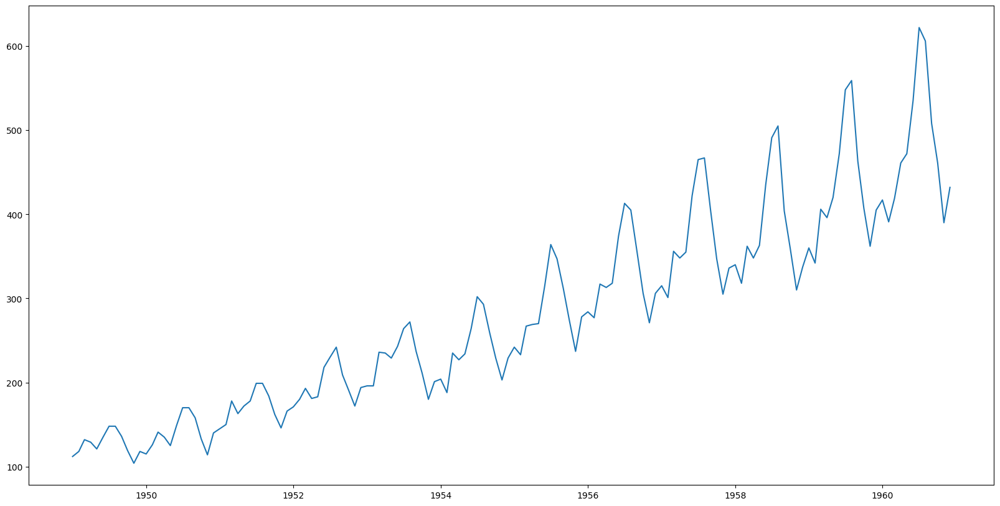

In [150]:
plt.figure(figsize=(20,10))
plt.plot(ts)

In [198]:

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean()
    rolstd = pd.Series(timeseries).rolling(window=12).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

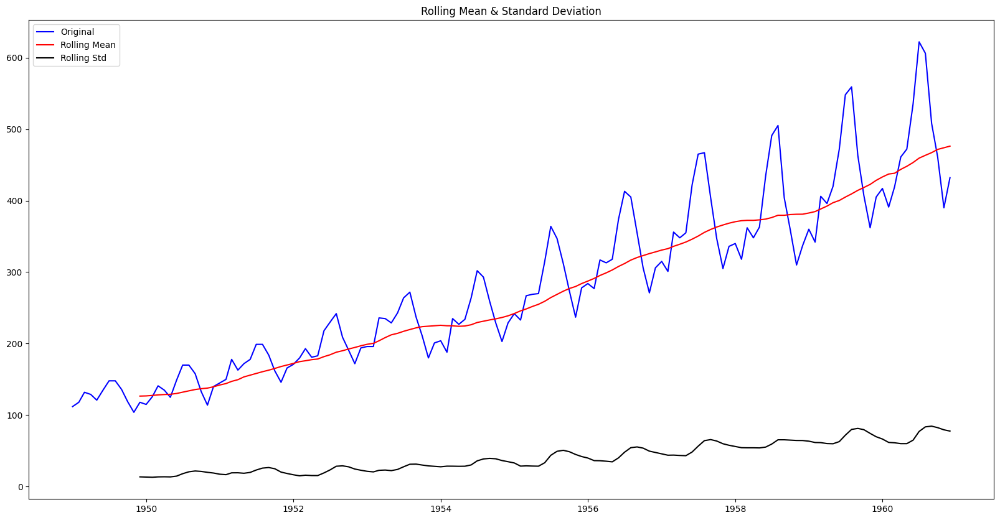

Results of Dickey-Fuller Test:
Test Statistic                   0.815369
p-value                          0.991880
#Lags Used                      13.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


In [152]:
plt.figure(figsize=(20,10))
test_stationarity(ts)

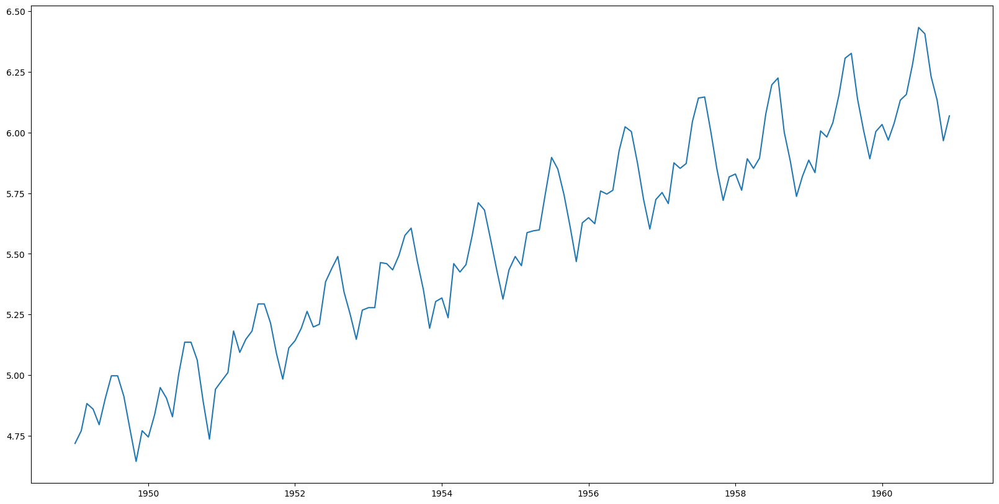

In [153]:
ts_log = np.log(ts)
plt.figure(figsize=(20,10))
plt.plot(ts_log)

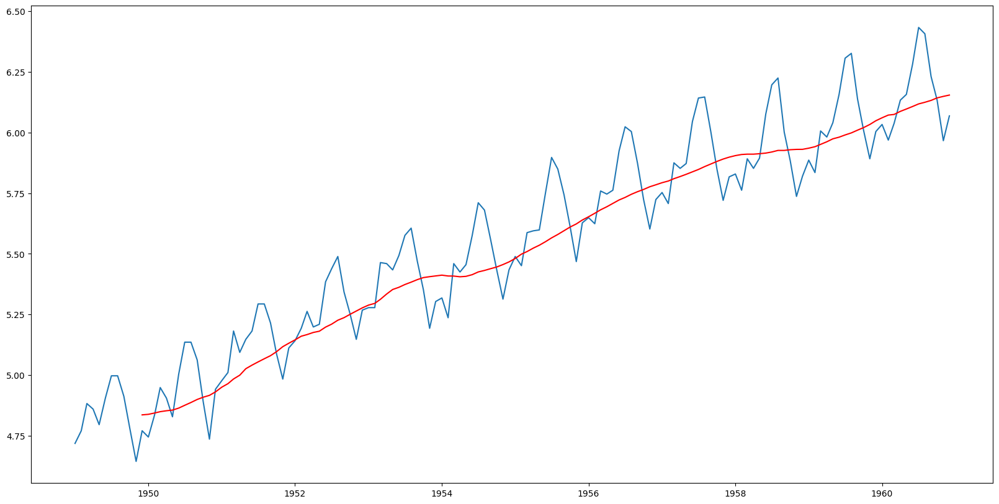

In [154]:
moving_avg = pd.Series(ts_log).rolling(12).mean()
plt.figure(figsize=(20,10))
plt.plot(ts_log)
plt.plot(moving_avg, color='red')

In [155]:
ts_log_moving_avg_diff = ts_log - moving_avg
ts_log_moving_avg_diff.head(12)

Month
1949-01-01         NaN
1949-02-01         NaN
1949-03-01         NaN
1949-04-01         NaN
1949-05-01         NaN
1949-06-01         NaN
1949-07-01         NaN
1949-08-01         NaN
1949-09-01         NaN
1949-10-01         NaN
1949-11-01         NaN
1949-12-01   -0.065494
Name: #Passengers, dtype: float64

In [156]:
ts_log_moving_avg_diff.dropna(inplace=True)
ts_log_moving_avg_diff.head()

Month
1949-12-01   -0.065494
1950-01-01   -0.093449
1950-02-01   -0.007566
1950-03-01    0.099416
1950-04-01    0.052142
Name: #Passengers, dtype: float64

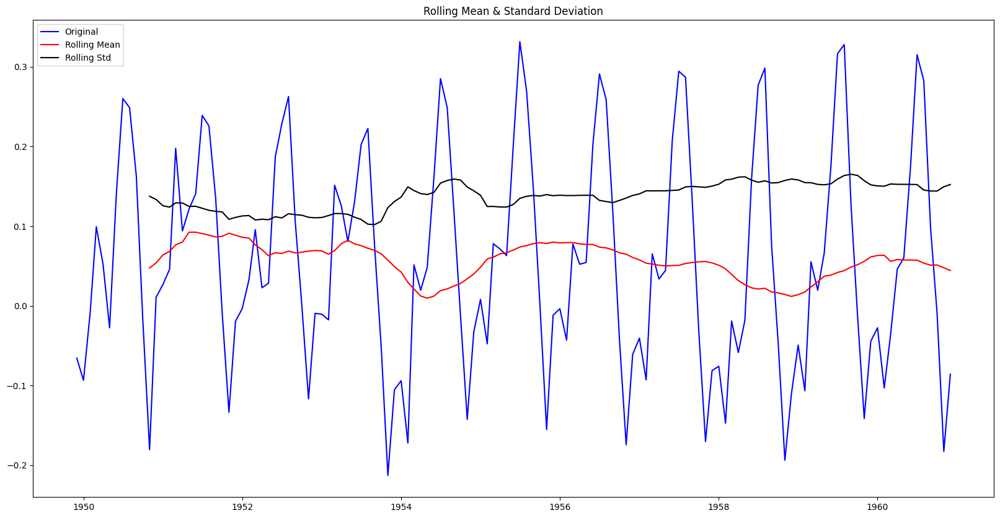

Results of Dickey-Fuller Test:
Test Statistic                  -3.162908
p-value                          0.022235
#Lags Used                      13.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64


In [157]:

plt.figure(figsize=(20,10))
test_stationarity(ts_log_moving_avg_diff)

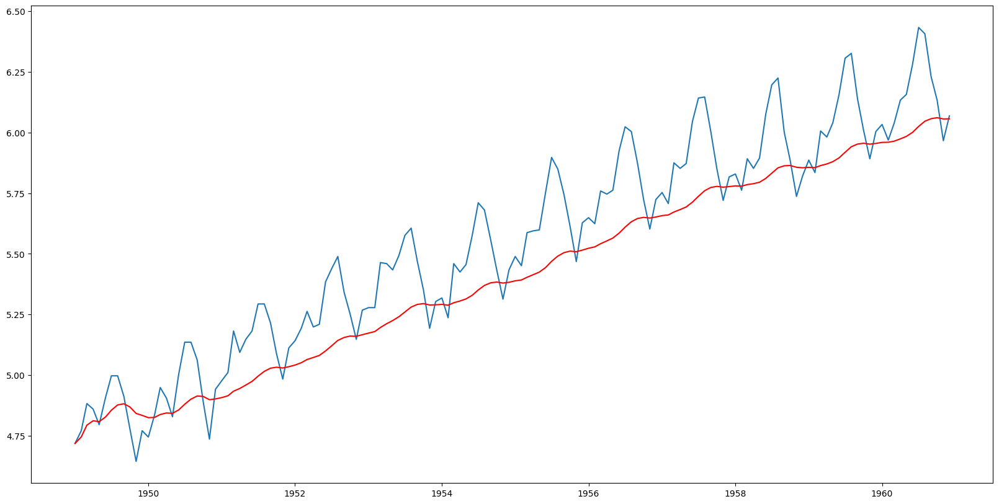

In [158]:
expwighted_avg = ts_log.ewm(halflife=12).mean()

plt.figure(figsize=(20,10))
plt.plot(ts_log)
plt.plot(expwighted_avg,color='red')

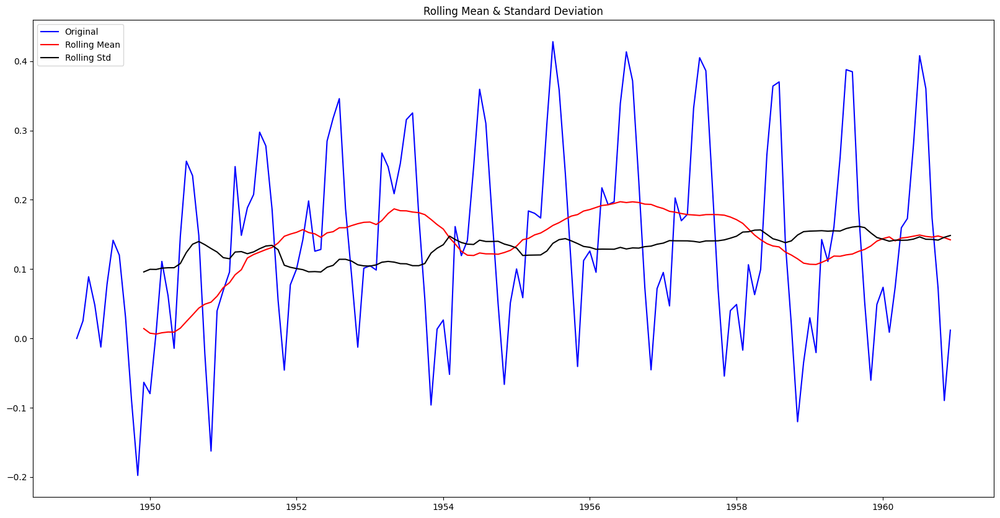

Results of Dickey-Fuller Test:
Test Statistic                  -3.601262
p-value                          0.005737
#Lags Used                      13.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


In [159]:
ts_log_ewma_diff = ts_log - expwighted_avg
plt.figure(figsize=(20,10))
test_stationarity(ts_log_ewma_diff)

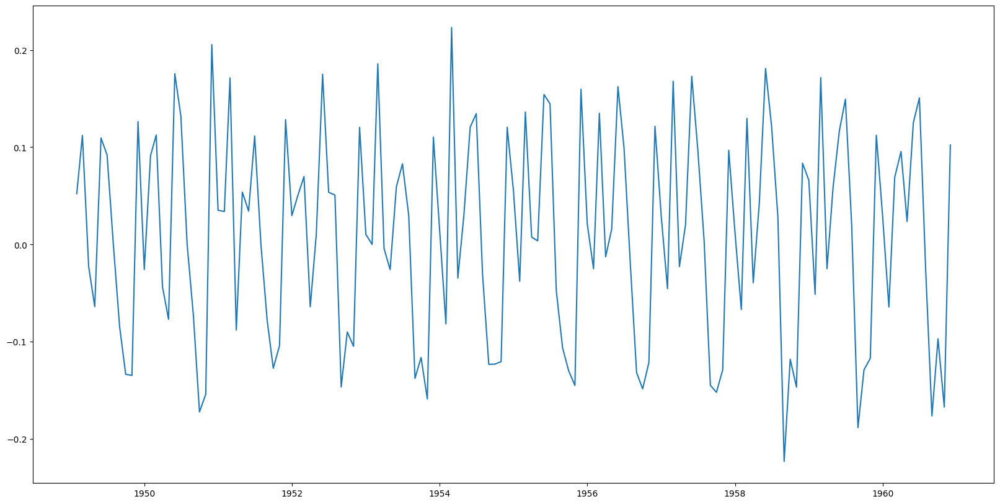

In [160]:
#Take first difference:
ts_log_diff = ts_log - ts_log.shift()
plt.figure(figsize=(20,10))
plt.plot(ts_log_diff)

In [161]:
ts_log_diff.isnull().sum()

1

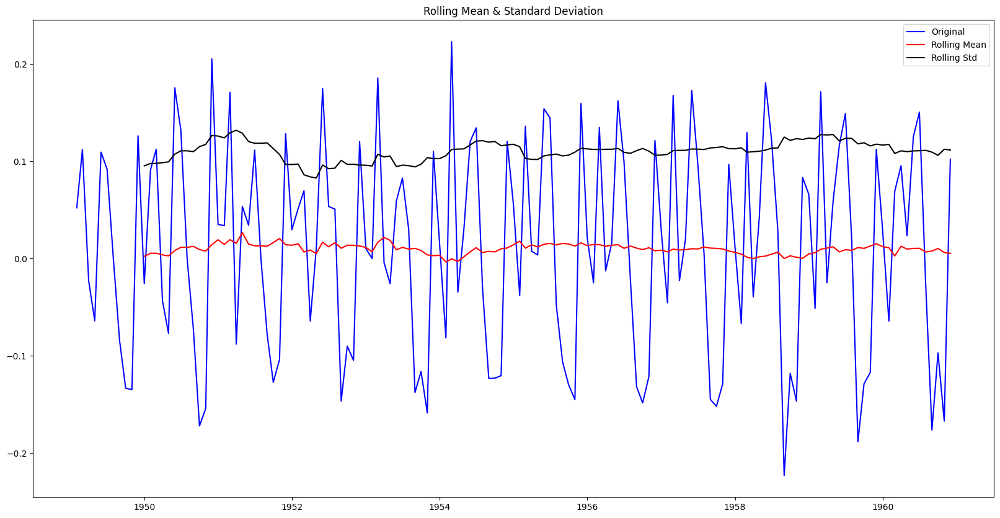

Results of Dickey-Fuller Test:
Test Statistic                  -2.717131
p-value                          0.071121
#Lags Used                      14.000000
Number of Observations Used    128.000000
Critical Value (1%)             -3.482501
Critical Value (5%)             -2.884398
Critical Value (10%)            -2.578960
dtype: float64


In [162]:
ts_log_diff.dropna(inplace=True)
plt.figure(figsize=(20,10))
test_stationarity(ts_log_diff)

In [163]:
ts_log.shape

(144,)

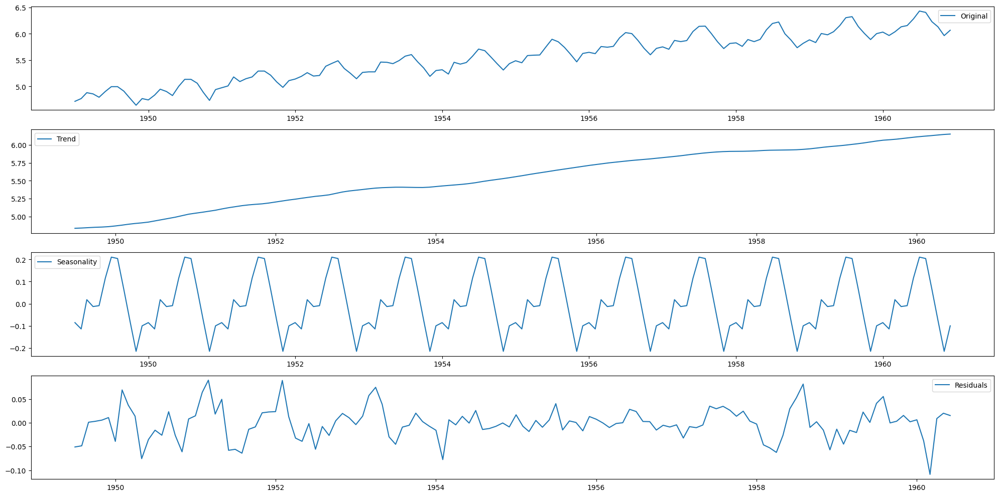

In [164]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(ts_log)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.figure(figsize=(20,10))
plt.subplot(411)
plt.plot(ts_log, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

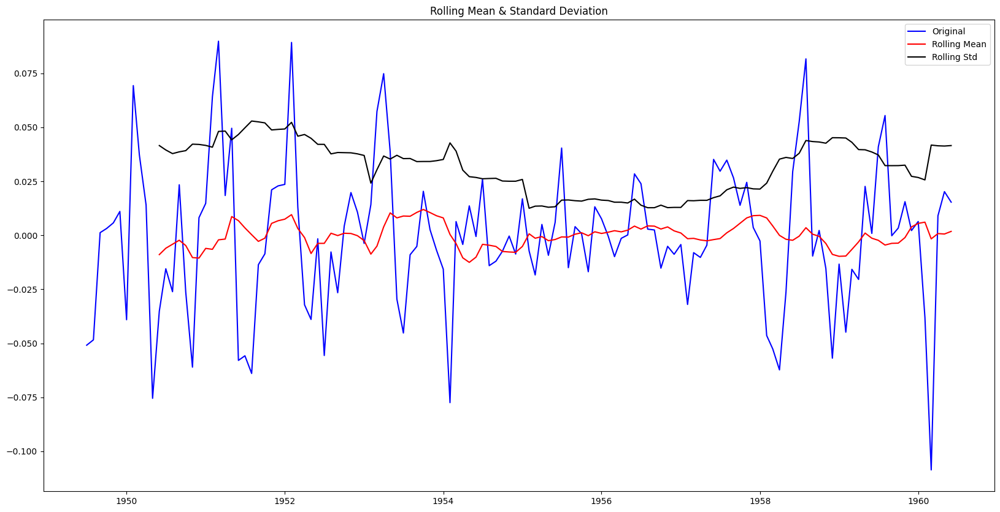

Results of Dickey-Fuller Test:
Test Statistic                -6.332387e+00
p-value                        2.885059e-08
#Lags Used                     9.000000e+00
Number of Observations Used    1.220000e+02
Critical Value (1%)           -3.485122e+00
Critical Value (5%)           -2.885538e+00
Critical Value (10%)          -2.579569e+00
dtype: float64


In [165]:
ts_log_decompose = residual
ts_log_decompose.dropna(inplace=True)
plt.figure(figsize=(20,10))
test_stationarity(ts_log_decompose)

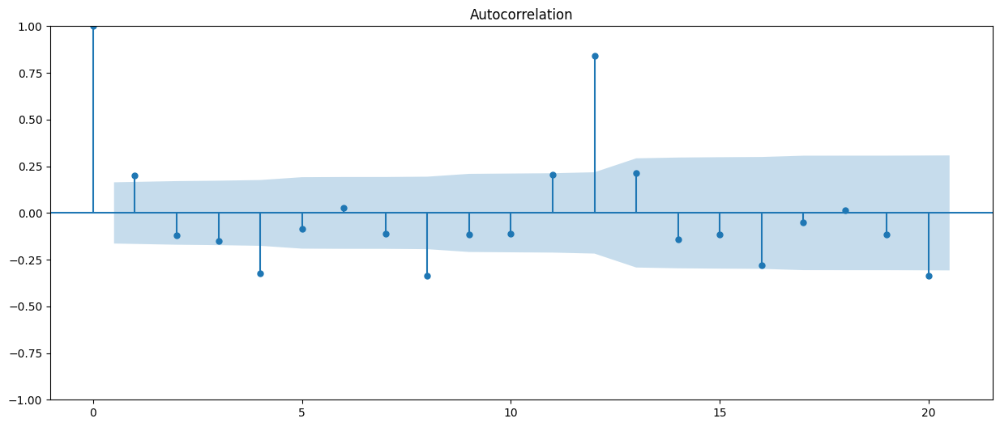

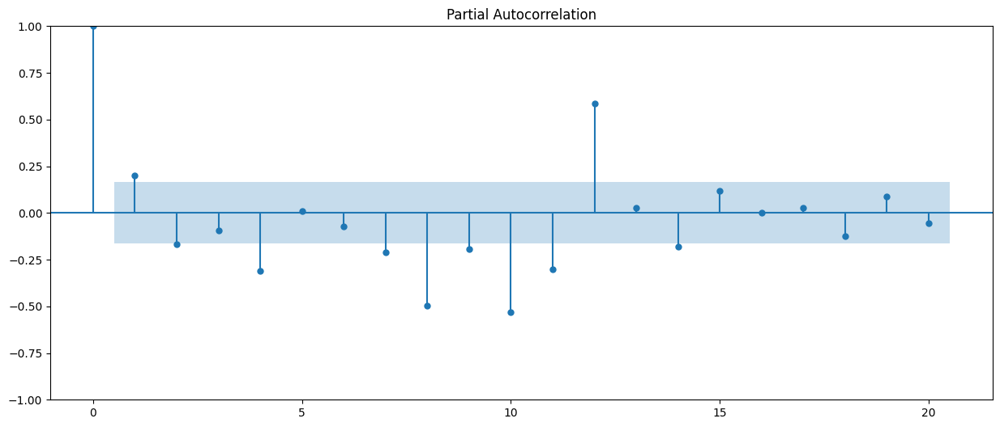

<Figure size 2000x1000 with 0 Axes>

In [176]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(ts_log_diff, lags =20)
plot_pacf(ts_log_diff, lags =20)
plt.figure(figsize=(20,10))
plt.show()

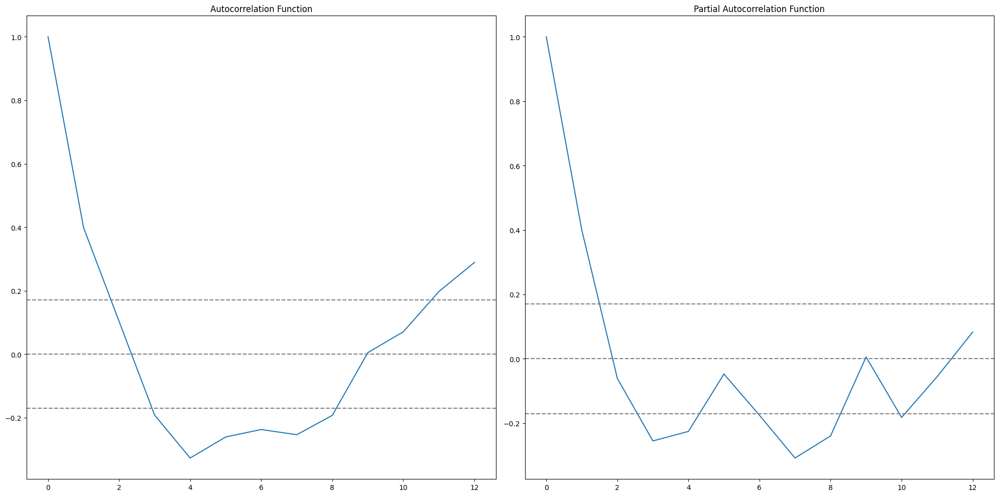

In [177]:

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARIMA
#ACF and PACF plots:
from statsmodels.tsa.stattools import acf, pacf  

lag_acf = acf(ts_log_decompose, nlags=12)
lag_pacf = pacf(ts_log_decompose, nlags=12, method='ols')

plt.figure(figsize=(20,10))
#Plot ACF:    
plt.subplot(121)    
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_decompose)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_log_decompose)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

#Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_decompose)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_log_decompose)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

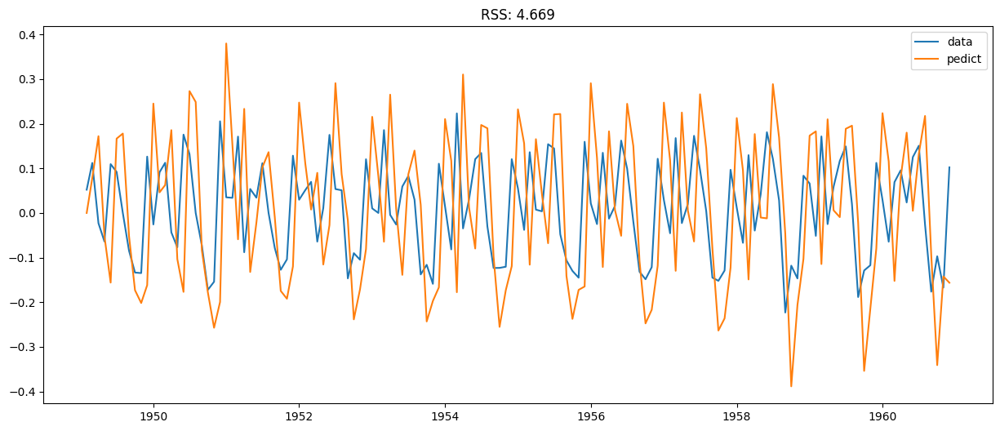

In [179]:
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings('ignore')


#AR model

model_AR = ARIMA(ts_log_diff, order=(1, 2, 0))
result_AR = model_AR.fit()

fitt_AR = result_AR.fittedvalues

plt.plot(ts_log_diff, label='data')
plt.plot(fitt_AR, label='pedict')
plt.title(f'RSS: {sum(result_AR.resid**2):.3f}')
plt.legend()
plt.show()

-------------

In [182]:
#### model MA

model_MA = ARIMA(ts_log_diff, order=(0, 1, 2))
result_MA = model_MA.fit()

fitt_MA = result_MA.fittedvalues

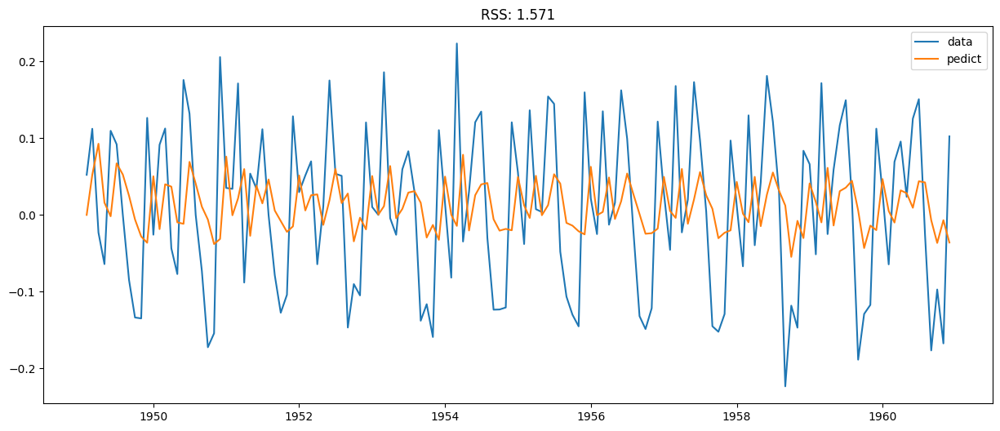

In [183]:
plt.plot(ts_log_diff, label='data')
plt.plot(fitt_MA, label='pedict')
plt.title(f'RSS: {sum(result_MA.resid**2):.3f}')
plt.legend()
plt.show()

---------------

In [184]:
from itertools import product

p = d = q = range(0, 3)

pdq = list(product(p, d, q))

In [185]:
### Model ARIMA

best_aic = float('inf')
best_bic = float('inf')
best_param = None

for param in pdq:
    try:
        model_ARIMA = ARIMA(ts_log_decompose, order=param)
        result_ARIMA = model_ARIMA.fit()

        aic = result_ARIMA.aic
        bic = result_ARIMA.bic

        if aic < best_aic:
            best_aic = aic
            best_param = param
        
        print(f'aic {aic=} | bic {bic=} | {param}')
    except:
        continue

print(f'best p d q -> {best_param} | best_aic -> {best_aic}')

aic aic=-518.9608048619971 | bic bic=-513.1952010168243 | (0, 0, 0)
aic aic=-536.8873490008016 | bic bic=-528.2389432330425 | (0, 0, 1)
aic aic=-541.5689602801004 | bic bic=-530.037752589755 | (0, 0, 2)
aic aic=-493.92468698701276 | bic bic=-491.0494896638116 | (0, 1, 0)
aic aic=-502.74267311968816 | bic bic=-496.99227847328586 | (0, 1, 1)
aic aic=-527.4894250895693 | bic bic=-518.8638331199659 | (0, 1, 2)
aic aic=-369.196593137673 | bic bic=-366.3290586872174 | (0, 2, 0)
aic aic=-482.2926429067776 | bic bic=-476.5575740058664 | (0, 2, 1)
aic aic=-490.23371321209373 | bic bic=-481.631109860727 | (0, 2, 2)
aic aic=-540.1284770343723 | bic bic=-531.4800712666132 | (1, 0, 0)
aic aic=-538.3541395813085 | bic bic=-526.822931890963 | (1, 0, 1)
aic aic=-547.0670150944275 | bic bic=-532.6530054814956 | (1, 0, 2)
aic aic=-500.88656580619215 | bic bic=-495.13617115978985 | (1, 1, 0)
aic aic=-531.1513673066564 | bic bic=-522.525775337053 | (1, 1, 1)
aic aic=-529.3273545791608 | bic bic=-517.82656

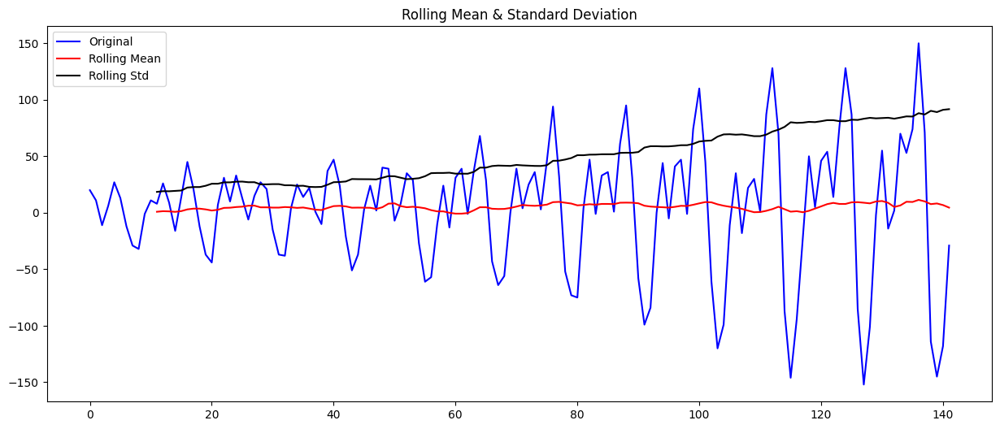

Results of Dickey-Fuller Test:
Test Statistic                  -2.961695
p-value                          0.038630
#Lags Used                      11.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


In [224]:
test_stationarity(train)

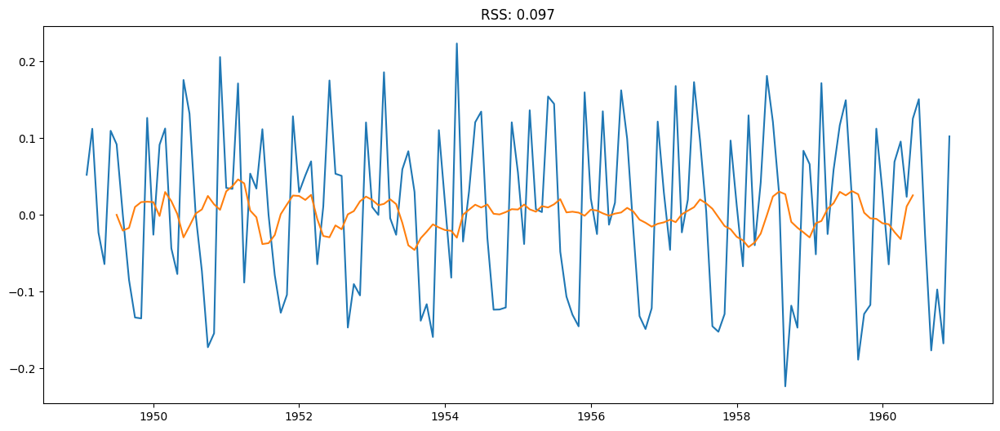

In [186]:
model_ARIMA = ARIMA(data, order=(2, 1, 1))
result_ARIMA = model_ARIMA.fit()

fit_ARIMA = result_ARIMA.fittedvalues

plt.plot(data, label='decompose data')
plt.plot(fit_ARIMA, label='pedict')
plt.title(f'RSS: {sum(result_ARIMA.resid**2):.3f}')
plt.show()

In [187]:
predict_arima_diff = pd.Series(fit_ARIMA)

predict_arima_diff.head()
print(predict_arima_diff.shape)

(132,)


In [188]:
cumsum = predict_arima_diff.cumsum()

In [189]:
prediction_ARIMA_log = pd.Series(ts_log[0], index=ts_log.index)
prediction_ARIMA_log = prediction_ARIMA_log.add(cumsum, fill_value=0)
prediction_ARIMA_log

Month
1949-01-01    4.718499
1949-02-01    4.718499
1949-03-01    4.718499
1949-04-01    4.718499
1949-05-01    4.718499
                ...   
1960-08-01    4.718499
1960-09-01    4.718499
1960-10-01    4.718499
1960-11-01    4.718499
1960-12-01    4.718499
Length: 144, dtype: float64

Text(0.5, 1.0, 'RMSE: 195.5241')

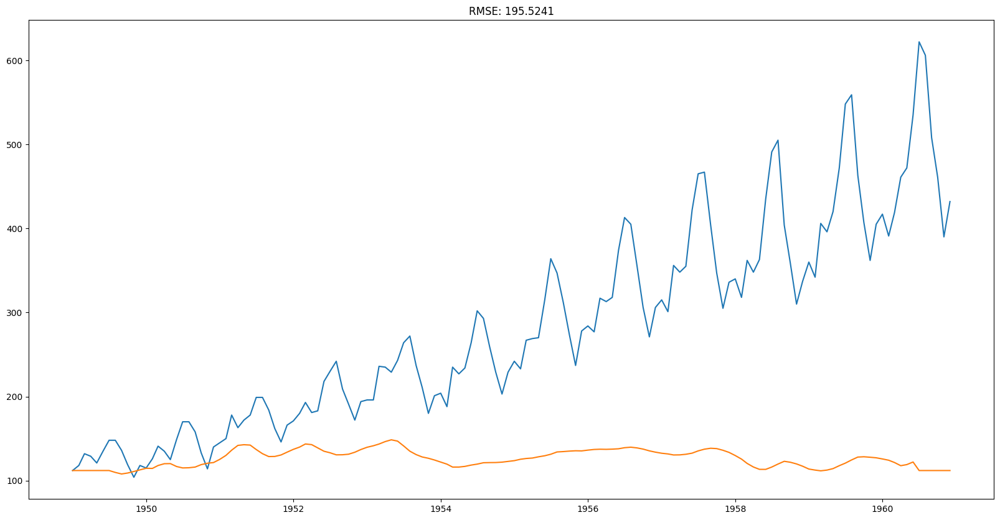

In [190]:
prediction_ARIMA = np.exp(prediction_ARIMA_log)

plt.figure(figsize=(20,10))
plt.plot(ts)
plt.plot(prediction_ARIMA)
plt.title('RMSE: %.4f'% np.sqrt(sum((prediction_ARIMA - ts)**2)/len(ts)))

In [191]:
pred = result_ARIMA.get_prediction('1960-12-01', end='1964-01-01')
mean = pred.predicted_mean
pred_ci = pred.conf_int()

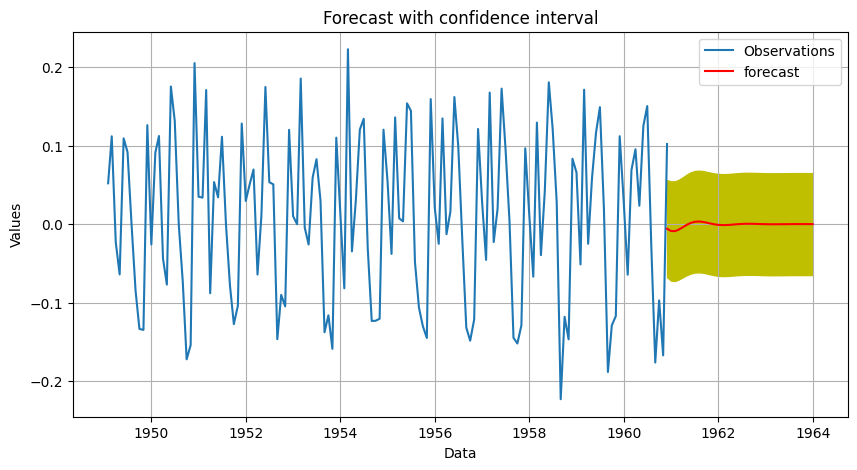

In [192]:
plt.figure(figsize=(10, 5))
plt.plot(ts_log_diff, label='Observations')
plt.plot(mean, label='forecast', c='r')
plt.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color='y')

plt.legend()
plt.xlabel('Data')
plt.ylabel('Values')
plt.title('Forecast with confidence interval')
plt.grid(True)
plt.show()

In [142]:
results = result_ARIMA.forecast(steps = 12)
converted_result = [(np.exp(x)) for x in [i for i in results]]

prediction_df = pd.DataFrame(converted_result)
prediction_df.T

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.137168,1.094331,1.041852,1.007875,0.995088,0.996043,1.002269,1.008117,1.011378,1.012206,1.011681,1.010817


--------------

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller


def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean()
    rolstd = pd.Series(timeseries).rolling(window=12).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

In [2]:
data = pd.read_csv('AirPassengers.csv', date_format='mixed', index_col=0, header=0)

In [3]:
from sklearn.linear_model import LinearRegression

X = np.arange(len(data)).reshape(-1, 1)
y = data.iloc[::, 0].values

model = LinearRegression().fit(X, y)
trend = model.predict(X)

detrend = y - trend

In [4]:
diff = data.diff().dropna()
diff = diff.values.reshape(-1)

rolling = data.rolling(window=12).mean()
rolling = rolling.dropna().values.reshape(-1)

In [5]:
sesonal_diff = data - data.shift(12)
sesonal_diff = sesonal_diff.dropna().values.reshape(-1)

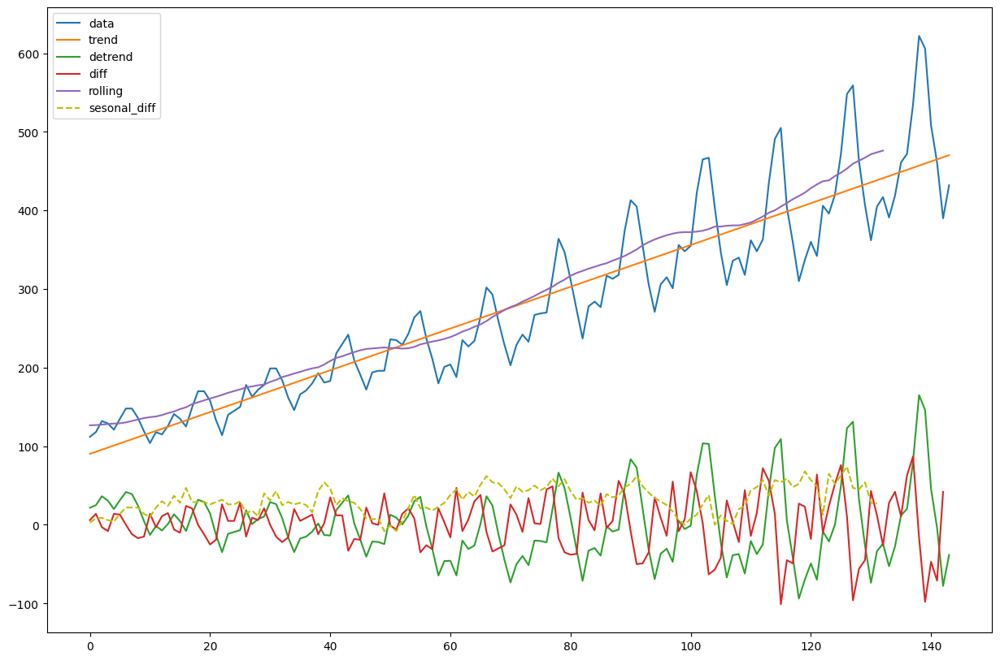

In [6]:
plt.figure(figsize=(15, 10))
plt.plot(data.values, label='data')
plt.plot(trend, label='trend')
plt.plot(detrend, label='detrend')
plt.plot(diff, label='diff')
plt.plot(rolling, label='rolling')
plt.plot(sesonal_diff, label='sesonal_diff', c='y', linestyle='--')
plt.legend()
plt.show()

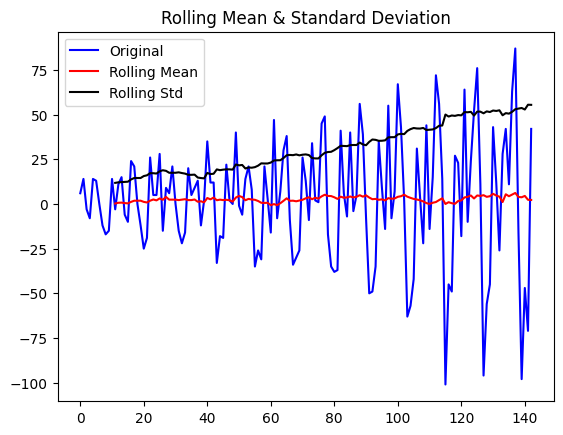

Results of Dickey-Fuller Test:
Test Statistic                  -2.829267
p-value                          0.054213
#Lags Used                      12.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


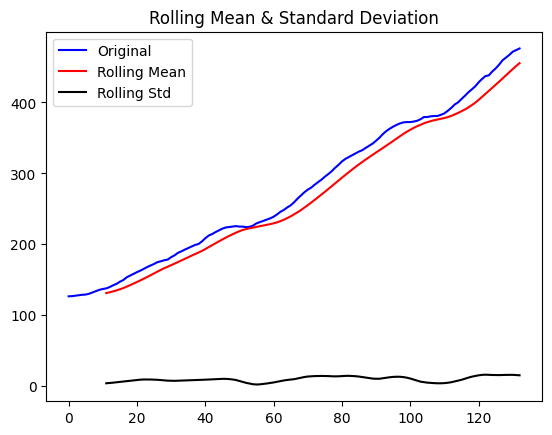

Results of Dickey-Fuller Test:
Test Statistic                   0.873695
p-value                          0.992737
#Lags Used                       2.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


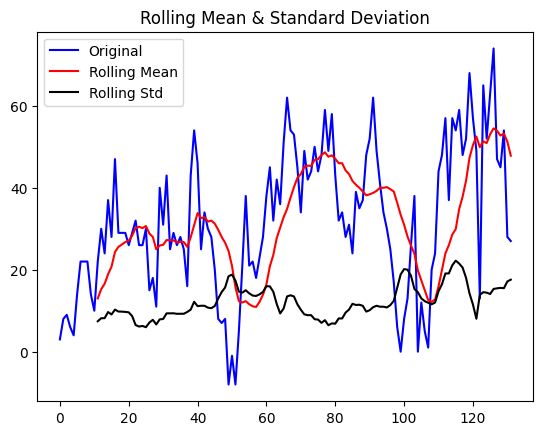

Results of Dickey-Fuller Test:
Test Statistic                  -3.383021
p-value                          0.011551
#Lags Used                       1.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


In [7]:
train = [diff, rolling, sesonal_diff]

for i in train:
    test_stationarity(i)

---------------

In [8]:
df = pd.read_csv('carbox_2030.csv', names=['year', 'mean'], date_format='fixed', index_col=0, header=0)

df.index = pd.to_datetime(df.index, format='mixed')

df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 250 entries, 2018-12-01 to 2039-09-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mean    250 non-null    float64
dtypes: float64(1)
memory usage: 3.9 KB


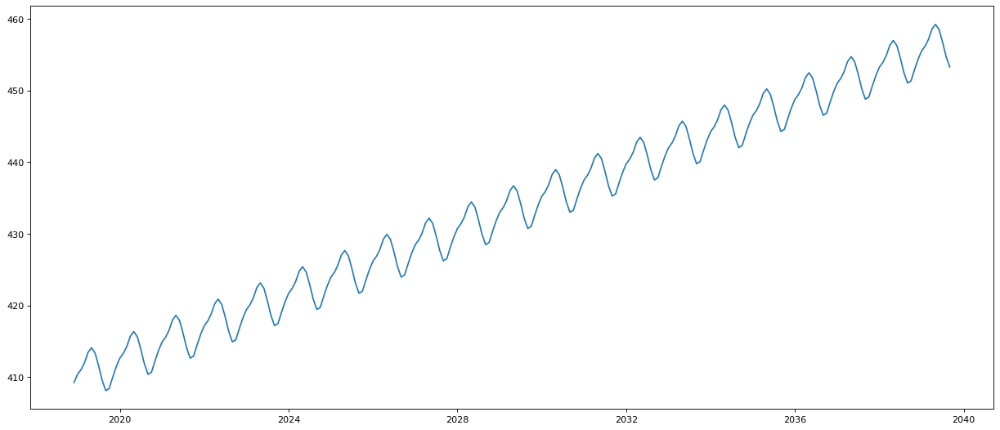

In [9]:
plt.figure(figsize=(19,8), dpi= 80)
plt.plot(df)
plt.show()

In [42]:
ts_log = np.log(df)

In [43]:
from statsmodels.tsa.seasonal import seasonal_decompose

decompose_result_mul = seasonal_decompose(ts_log, model='mul', period=12)
decompose_result_add = seasonal_decompose(ts_log, model='add', period=12)

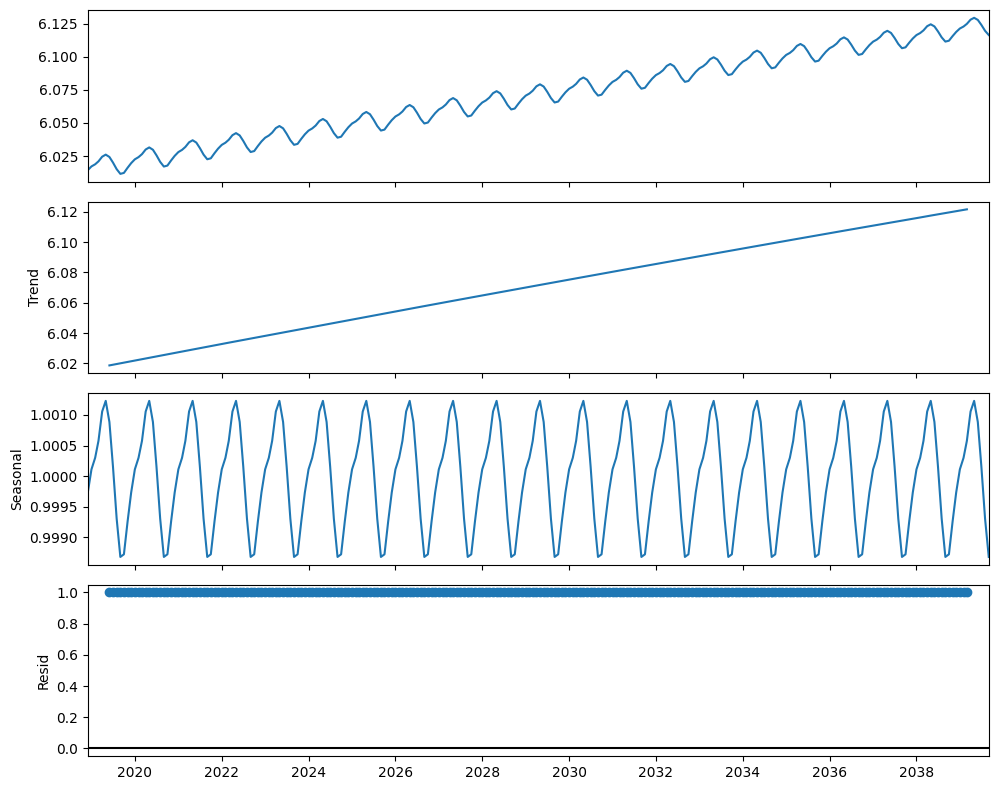

In [44]:
plt.rcParams['figure.figsize'] = 10, 8
decompose_result_mul.plot()
plt.show()

In [45]:
sesonal = decompose_result_mul.seasonal
trend = decompose_result_mul.trend
resid = decompose_result_mul.resid

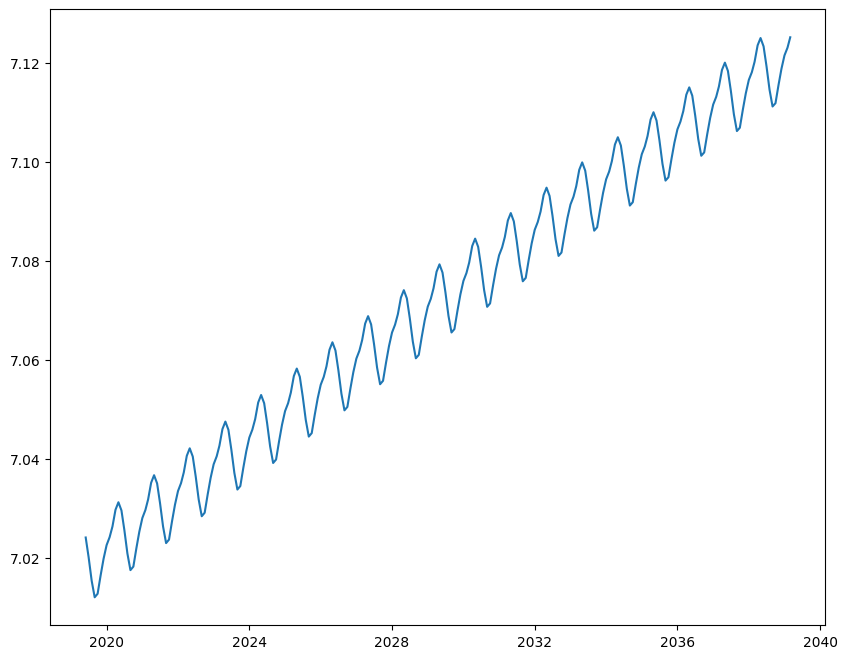

In [56]:
new = trend * sesonal + resid

plt.plot(new)
plt.show()

----------------

In [258]:
import numpy as np
import pandas as pp
import matplotlib.pyplot as plt
from statsforecast.models import AutoARIMA, AutoETS
from statsforecast.utils import generate_series

df = generate_series(n_series=1, freq='ME')

In [234]:
Y_train = df[:-6]
Y_test = df[-6:]

In [259]:
data = pd.read_csv('AirPassengers.csv')

data['unique_id'] = 0

In [260]:
data.rename(columns={'Month': 'ds', '#Passengers': 'y'}, inplace=True)

In [261]:
data = data[['unique_id', 'ds', 'y']]

In [262]:
data['ds'] = pd.to_datetime(data['ds'], format='mixed')

In [277]:
train = data[:-6]
test = data[-6:]

print(train.shape)
print(test.shape)

(138, 3)
(6, 3)


In [278]:
train.tail()

,unique_id,ds,y
133,0,1960-02-01,391
134,0,1960-03-01,419
135,0,1960-04-01,461
136,0,1960-05-01,472
137,0,1960-06-01,535


In [279]:
from statsforecast import StatsForecast

seasonal_length = 12
horizont = len(test)

models = [AutoARIMA(season_length=seasonal_length), AutoETS(season_length=seasonal_length, model='ZMZ')]

model = StatsForecast(models=models, freq='ME', n_jobs=-1)
result_model = model.fit(df=train)

In [280]:
forecast = result_model.forecast(df=train, h=12).reset_index()

forecast.head()

,index,unique_id,ds,AutoARIMA,AutoETS
0,0,0,1960-06-30,607.480408,582.645386
1,1,0,1960-07-31,619.606567,583.841797
2,2,0,1960-08-31,523.246216,507.797058
3,3,0,1960-09-30,467.361542,445.386780
4,4,0,1960-10-31,422.324646,390.060822


In [282]:
forecast_copy = forecast.copy()

In [295]:
predict = forecast_copy[['ds','AutoARIMA', 'AutoETS']]
predict.index = predict['ds']

del predict['ds']

In [297]:
train[['ds', 'y']]

train.index = train['ds']

del train['ds']

In [299]:
del train['unique_id']

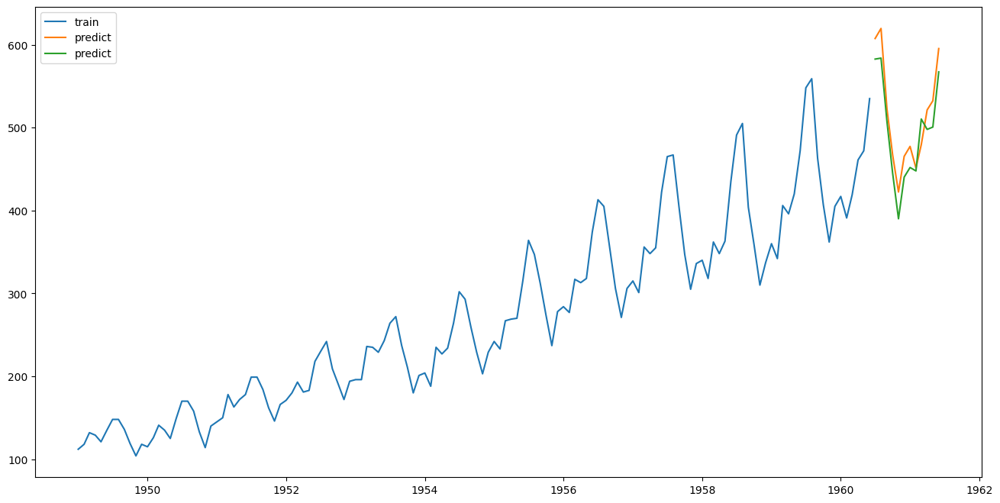

In [300]:
plt.figure(figsize=(16, 8))
plt.plot(train, label='train')
plt.plot(predict, label='predict')
plt.legend()
plt.show()

----

In [163]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsforecast.models import AutoARIMA, AutoETS
from statsforecast import StatsForecast

df = pd.read_csv('cardox.csv')

df['id'] = 0

In [164]:
df = df[['id', 'date', 'value']]

In [165]:
df['date'] = pd.to_datetime(df['date'], format='mixed')

In [206]:
split = round(len(df) * 0.3)

In [207]:
train = df[:-split]
test = df[-split:]

In [211]:
df_copy = df[['date', 'value']]

df_copy.index = df_copy['date']
del df_copy['date']

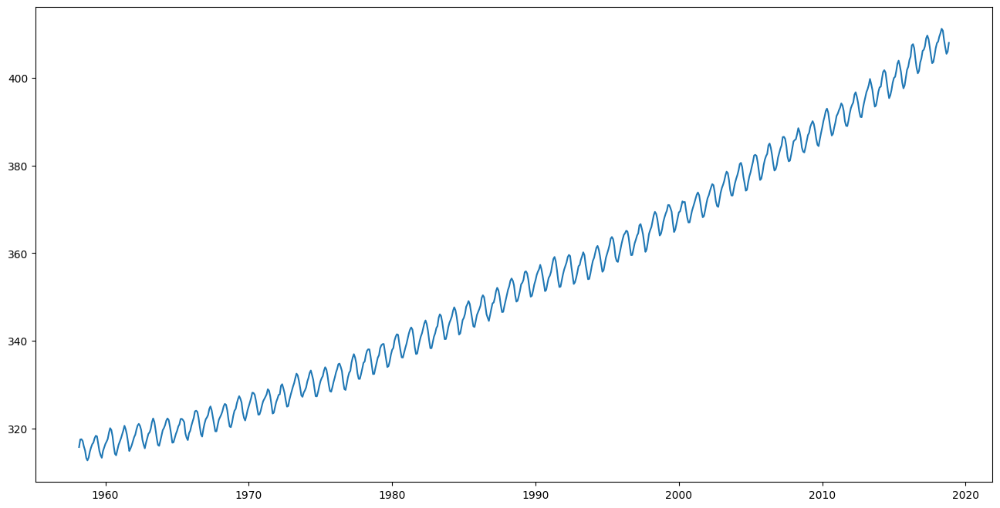

In [212]:
plt.figure(figsize=(16, 8))
plt.plot(df_copy)
plt.show()

In [213]:
train.columns = ['unique_id', 'ds', 'y']
test.columns = ['unique_id', 'ds', 'y']

In [214]:
from statsforecast import StatsForecast

seasonal_length = 12
horizont = len(test)

models = [AutoARIMA(season_length=seasonal_length), AutoETS(season_length=seasonal_length, model='ZMZ')]

model = StatsForecast(models=models, freq='ME', n_jobs=-1)
result_model = model.fit(df=train)

In [215]:
forecast = result_model.predict(h=len(test))

In [216]:
forecast_copy = forecast[['ds','AutoARIMA','AutoETS']]

In [217]:
forecast_copy.index = forecast['ds']

In [218]:
del forecast_copy['ds']

In [219]:
train_copy = train[['ds', 'y']]
train_copy.index = train_copy['ds']

del train_copy['ds']

In [220]:
test_copy = test[['ds', 'y']]
test_copy.index = test_copy['ds']
del test_copy['ds']

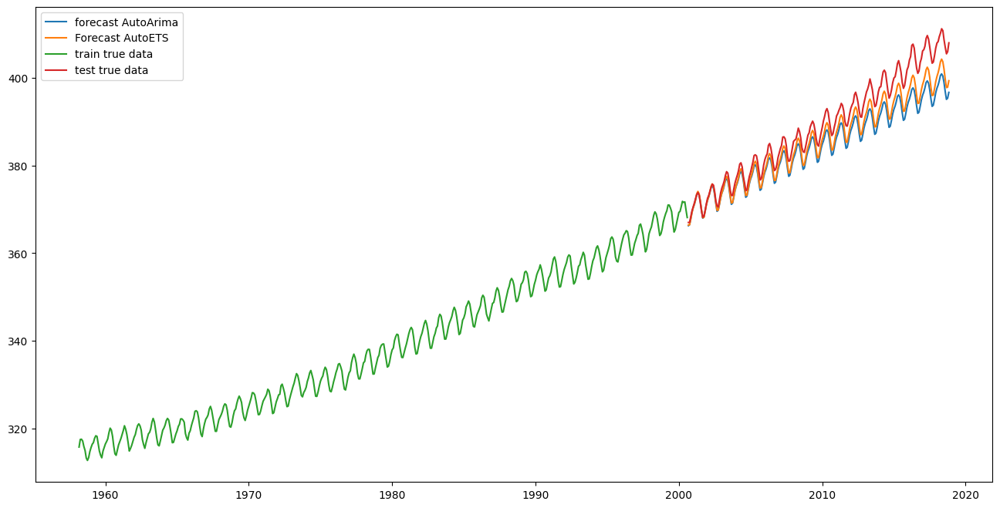

In [221]:
plt.figure(figsize=(16, 8))
plt.plot(forecast_copy['AutoARIMA'], label='forecast AutoArima')
plt.plot(forecast_copy['AutoETS'], label='Forecast AutoETS')
plt.plot(train_copy, label='train true data')
plt.plot(test_copy, label='test true data')
plt.legend()
plt.show()

--------------------

In [227]:
from pmdarima.arima import auto_arima


model_autoarima = auto_arima(train_copy, seasonal=True, m=12, trace=True, stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=331.794, Time=1.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1633.950, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1099.922, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1635.686, Time=0.02 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=534.413, Time=1.53 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=366.731, Time=2.76 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=359.662, Time=2.55 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=977.094, Time=0.29 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=2.52 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=424.521, Time=1.97 sec
 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=349.807, Time=3.07 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=326.895, Time=1.06 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC

In [228]:
predict = model_autoarima.predict(len(test_copy))

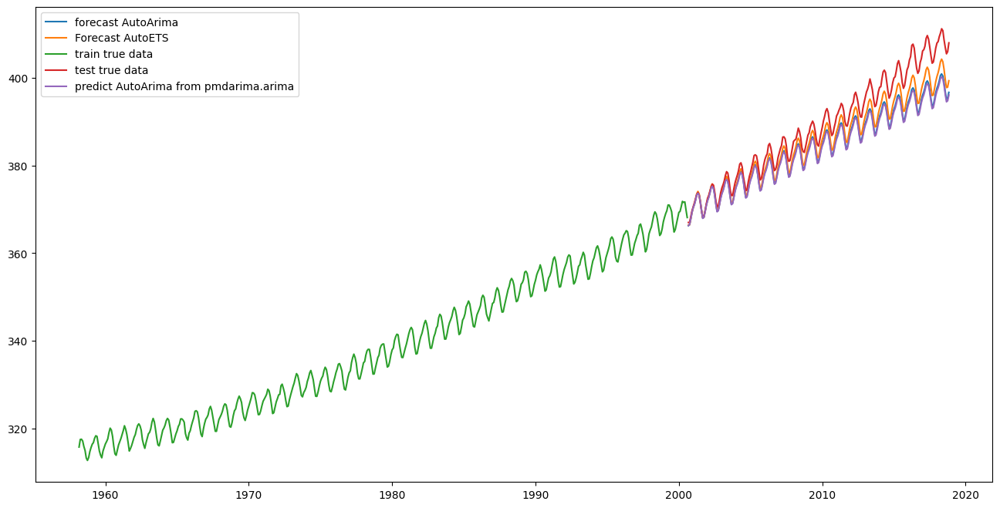

In [230]:
plt.figure(figsize=(16, 8))
plt.plot(forecast_copy['AutoARIMA'], label='forecast AutoArima')
plt.plot(forecast_copy['AutoETS'], label='Forecast AutoETS')
plt.plot(train_copy, label='train true data')
plt.plot(test_copy, label='test true data')
plt.plot(predict, label='predict AutoArima from pmdarima.arima')
plt.legend()
plt.show()

------------

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pyaf.ForecastEngine as autof

In [89]:
from statsforecast.utils import generate_series

df = generate_series(n_series=1, freq='ME')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222 entries, 0 to 221
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   unique_id  222 non-null    category      
 1   ds         222 non-null    datetime64[ns]
 2   y          222 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(1)
memory usage: 3.9 KB


In [112]:
df = pd.read_csv('AirPassengers.csv', names=['ds', 'y'], header=0)
df['ds']= pd.to_datetime(df['ds'], format='mixed')
df['id'] = 0

In [113]:
df = df[['id', 'ds', 'y']]

In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144 entries, 0 to 143
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   id      144 non-null    int64         
 1   ds      144 non-null    datetime64[ns]
 2   y       144 non-null    int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 3.5 KB


In [115]:
split = round(df.shape[0] * 0.2)

Train = df[:-split]
Test = df[-split:]

In [116]:
Test.shape

(29, 3)

In [117]:
Train.shape

(115, 3)

In [118]:
import pyaf.ForecastEngine as autof

horizon = len(Test)
lEngine = autof.cForecastEngine()

lEngine.train(iInputDS = Train, iTime = 'ds', iSignal = 'y', iHorizon = horizon)

INFO:pyaf.std:TRAINING_ENGINE_START {'Signals': ['y'], 'Horizons': {'y': 29}}
INFO:pyaf.std:TRAINING_ENGINE_END 5.109


In [119]:
forecast_df = lEngine.forecast(Train, horizon)

forecast_df.head()

INFO:pyaf.std:FORECASTING_ENGINE_START {'Signals': ['y'], 'Horizons': {'y': 29}}
INFO:pyaf.std:FORECASTING_ENGINE_END 0.194


,ds,y,y_scaled,RelDiff_y,row_number,ds_Normalized,RelDiff_y_ConstantTrend,RelDiff_y_ConstantTrend_residue,cycle_internal,RelDiff_y_ConstantTrend_residue_Cycle_12,RelDiff_y_ConstantTrend_residue_Cycle_12_residue,RelDiff_y_ConstantTrend_residue_Cycle_12_residue_AR(28),RelDiff_y_ConstantTrend_residue_Cycle_12_residue_AR(28)_residue,y_Transformed,RelDiff_y_Trend,RelDiff_y_Trend_residue,RelDiff_y_Cycle,RelDiff_y_Cycle_residue,RelDiff_y_AR,RelDiff_y_AR_residue,RelDiff_y_TransformedForecast,RelDiff_y_Detrended,RelDiff_y_Deseasonalized,y_TransformedForecast_inverted,y_Forecast,RelDiff_y_TransformedResidue,y_Residue,y_Forecast_Lower_Bound,y_Forecast_Upper_Bound,y_Forecast_Quantile_10,y_Forecast_Quantile_20,y_Forecast_Quantile_30,y_Forecast_Quantile_40,y_Forecast_Quantile_50,y_Forecast_Quantile_60,y_Forecast_Quantile_70,y_Forecast_Quantile_80,y_Forecast_Quantile_90
0,1949-01-01,112.0,0.228106,0.000000,0,0.000000,0.01832,-0.018320,0,-0.000066,-0.018254,0.007636,9.192082e-09,0.000000,0.01832,-0.018320,-0.000066,-0.018254,0.007636,9.192082e-09,0.025890,0.007571,0.025956,0.234012,114.899723,-0.025890,-2.899723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1949-02-01,118.0,0.240326,0.053571,1,0.008939,0.01832,0.035252,1,-0.030644,0.065895,0.007636,5.357572e-02,0.053571,0.01832,0.035252,-0.030644,0.065895,0.007636,5.357572e-02,-0.004688,-0.023007,0.025956,0.232915,114.361117,0.058259,3.638883,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1949-03-01,132.0,0.268839,0.118644,2,0.017013,0.01832,0.100324,2,0.126844,-0.026519,-0.012465,1.186730e-01,0.118644,0.01832,0.100324,0.126844,-0.026519,-0.012465,1.186730e-01,0.132699,0.114379,0.005855,0.263822,129.536678,-0.014055,2.463322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1949-04-01,129.0,0.262729,-0.022727,3,0.025952,0.01832,-0.041047,3,-0.046705,0.005658,0.009038,-2.271954e-02,-0.022727,0.01832,-0.041047,-0.046705,0.005658,0.009038,-2.271954e-02,-0.019347,-0.037666,0.027358,0.258718,127.030568,-0.003381,1.969432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1949-05-01,121.0,0.246436,-0.062016,4,0.034602,0.01832,-0.080335,4,-0.004808,-0.075528,-0.018406,-6.201712e-02,-0.062016,0.01832,-0.080335,-0.004808,-0.075528,-0.018406,-6.201712e-02,-0.004894,-0.023213,-0.000086,0.257452,126.408918,-0.057122,-5.408918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


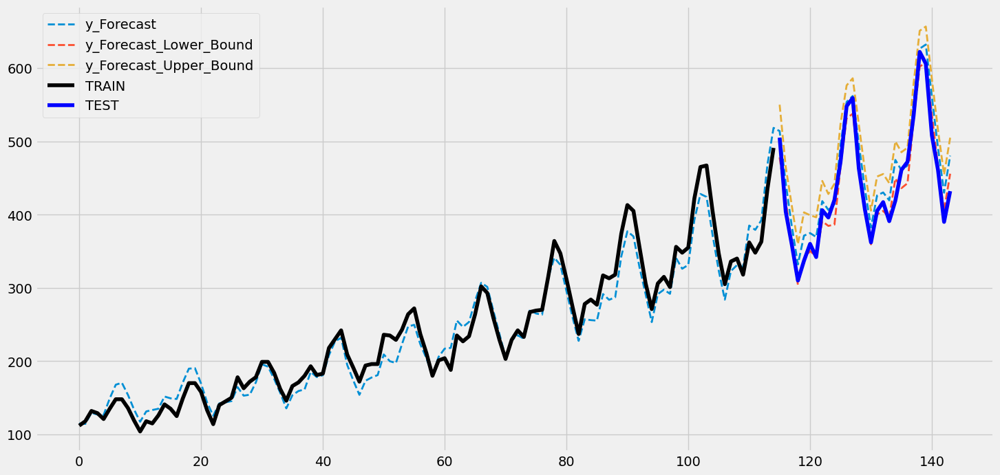

In [124]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(16, 8))
plt.plot(forecast_df[['y_Forecast','y_Forecast_Lower_Bound', 'y_Forecast_Upper_Bound']],
         label=['y_Forecast','y_Forecast_Lower_Bound', 'y_Forecast_Upper_Bound'], linewidth=2, linestyle='--')
plt.plot(Train['y'], label='TRAIN', c='black',)
plt.plot(Test['y'], label='TEST', c='blue')
plt.legend()
plt.show()

--------------------

In [140]:
train = Train.reset_index(drop=True)
test = Test.reset_index(drop=True)

In [145]:
del train['id'], test['id']

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from neuralprophet import NeuralProphet
import warnings
warnings.filterwarnings('ignore')


data = pd.read_csv('cardox.csv', names=['ds', 'y'], header=0)
data['ds'] = pd.to_datetime(data['ds'], format='mixed')

In [29]:
split = round(len(data) * 0.3)

train = data[:-split]
test = data[-split:]

print(f'{train.shape=}')
print(f'{test.shape=}')

train.shape=(510, 2)
test.shape=(219, 2)


WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency MS corresponds to [99.804]% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - ME
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling weekly seasonality. Run NeuralProphet with weekly_seasonality=True to override this.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 140


Training: |                                                                                                                                                  | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (16) is too small than the required number                     for the learning rate finder (219). The results might not be optimal.

Finding best initial lr: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 219/219 [00:01<00:00, 188.33it/s]


Epoch 1:   1%|▉                                                                                                                                   | 1/140 [00:00<00:00, 488.16it/s]
Validation: |                                                                                                                                                | 0/? [00:00<?, ?it/s]
Epoch 2:   1%|█▉                                                                                                                                  | 2/140 [00:00<00:00, 585.51it/s]
Validation: |                                                                                                                                                | 0/? [00:00<?, ?it/s]
Epoch 3:   2%|██▊                                                                                                                                 | 3/140 [00:00<00:00, 694.54it/s]
Validation: |                                                                                       

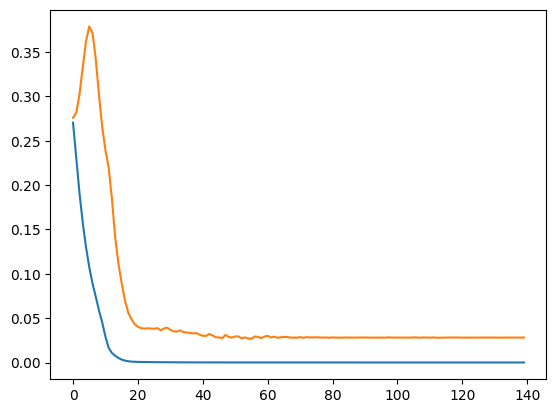

In [30]:
m = NeuralProphet()
metrics = m.fit(train, freq='ME', validation_df=test, progress='plot')

In [35]:
metrics.tail(1)

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,train_loss,reg_loss,MAE,RMSE,Loss,RegLoss
139,5.997175,6.966288,0.028233,0.0,139,0.000158,0.0,0.436243,0.56334,0.000158,0.0


In [37]:
forecast = m.predict(train)
fig = m.plot(forecast)
fig

INFO - (NP.df_utils._infer_frequency) - Major frequency MS corresponds to [99.804]% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - ME
INFO - (NP.df_utils._infer_frequency) - Major frequency MS corresponds to [99.804]% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - ME


Predicting DataLoader 0: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 243.98it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
ERROR - (NP.plotly.plot) - plotly-resampler is not installed. Please install it to use the resampler.


In [38]:
forecast_test = m.predict(test)

m = m.highlight_nth_step_ahead_of_each_forecast(1)
fig = m.plot(forecast_test)

INFO - (NP.df_utils._infer_frequency) - Major frequency MS corresponds to [99.543]% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - ME
INFO - (NP.df_utils._infer_frequency) - Major frequency MS corresponds to [99.543]% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - ME


Predicting DataLoader 0: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 208.60it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
ERROR - (NP.plotly.plot) - plotly-resampler is not installed. Please install it to use the resampler.


In [39]:
fig

In [44]:
fig_param = m.plot_parameters()
fig_param

WARNING - (NP.forecaster.plot_parameters) - highlight_forecast_step_n is ignored since autoregression not enabled.
ERROR - (NP.plotly.plot_parameters) - plotly-resampler is not installed. Please install it to use the resampler.


----------------

In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_datareader as web
import datetime

car = pd.read_csv('cardox.csv')

car['date'] = pd.to_datetime(car['date'], format='mixed')
car.index = car['date']

In [78]:
del car['date']

In [79]:
train = car[:'2010-01-01']
test = car['2010-01-01':]

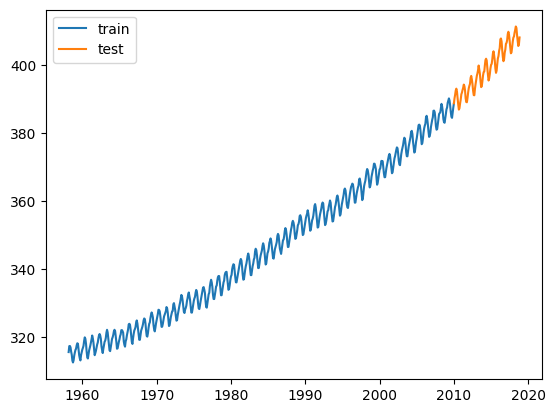

In [80]:
plt.plot(train, label='train')
plt.plot(test, label='test')
plt.legend()
plt.show()

In [81]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [82]:
y = car['value']

In [83]:
from itertools import product

p = d = q = range(0, 2)

pdq = list(product(p, d, q))

seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(product(p, d, q))] 

In [100]:
import warnings
warnings.filterwarnings("ignore")

best_aic = float('inf')
best_bic = float('inf')
best_param = None

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = SARIMAX(y,
            order=param,
            seasonal_order=param_seasonal,
            enforce_stationarity=False,
            enforce_invertibility=False)
            results = mod.fit()

            aic = results.aic
            bic = results.bic

            if best_aic > aic:
                best_aic = aic
                best_param = (param, param_seasonal)
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue
print(f'BEST Params {best_param} | aic {best_aic} | bic {best_bic}')

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:10617.39832828139
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:10458.590603861685
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2822.10872847603
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:2377.9596231942323
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:1521.8785288720615
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:1516.9589115299223
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:1864.338786334426
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1357.4062887714906
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:9604.771834147039
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:8519.191592495547
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2101.364214527621
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1884.3261540862468
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:1147.6717258502683
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:1145.0223733394632
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:1582.5491836408755
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1055.3559164921926
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2371.0019758047247
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:1756.5111480115288

In [106]:
model_final = SARIMAX(y, param=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
result_model = model_final.fit()

In [107]:
y_pred = result_model.get_forecast(len(test.index))
conf = y_pred.conf_int(alpha=0.5)

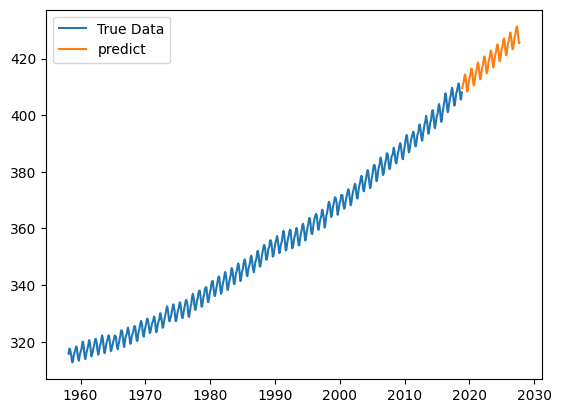

In [109]:
plt.plot(y, label='True Data')
plt.plot(y_pred.predicted_mean, label='predict')
plt.legend()
plt.show()

In [112]:
predict = result_model.predict(start=test.index[0], end=test.index[-1])

In [113]:
predict

2010-01-01    388.565922
2010-02-01    389.467181
2010-03-01    391.072454
2010-04-01    392.443418
2010-05-01    392.969444
                 ...    
2018-07-01    409.132115
2018-08-01    406.614193
2018-09-01    405.509388
2018-10-01    405.734352
2018-11-01    407.489286
Freq: MS, Name: predicted_mean, Length: 107, dtype: float64

---------------

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import VAR, VARMAX
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from tqdm.notebook import tqdm

df = pd.read_csv('Analyse_Training.csv')

In [2]:
date = pd.date_range(start='2020-01-01', end='2022-08-01', freq='ME')

In [3]:
df['date'] = date

In [4]:
df.index = df['date']
del df['date']

In [5]:
df.head()

,Month,No_Employees,Training_Deficiencies
date,,,
2020-01-31,Jan-20,132,210
2020-02-29,Feb-20,134,211
2020-03-31,Mar-20,132,191
2020-04-30,Apr-20,130,176
2020-05-31,May-20,130,176


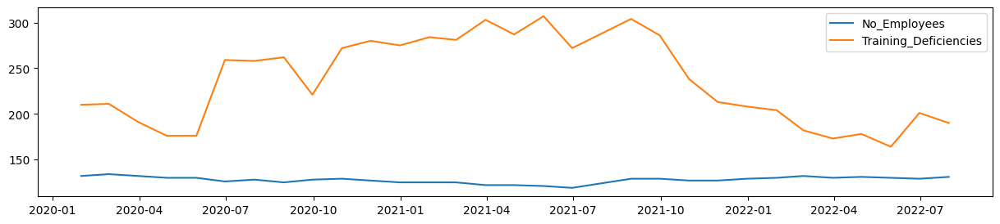

In [6]:
plt.rcParams['figure.figsize'] = 15, 3
plt.plot(df['No_Employees'], label='No_Employees')
plt.plot(df['Training_Deficiencies'], label='Training_Deficiencies')
plt.legend()
plt.show()

In [7]:
def stationary_test(data):

    res = adfuller(data)

    t_static = res[0]
    p_value = res[1]
    t_critiacal = res[4]

    if p_value < 0.05:
        print('Stationary')
    else:
        print('No Stationary')
    print('')
    print(f'{p_value = }')
    print(f'{t_static = }')
    print(f'{t_critiacal = }')

In [8]:
stationary_test(df['No_Employees'])

No Stationary

p_value = 0.3543160383318339
t_static = -1.853347144293552
t_critiacal = {'1%': -3.6699197407407405, '5%': -2.9640707407407407, '10%': -2.621171111111111}


In [9]:
stationary_test(df['Training_Deficiencies'])

No Stationary

p_value = 0.5642345763721401
t_static = -1.437371326974487
t_critiacal = {'1%': -3.6699197407407405, '5%': -2.9640707407407407, '10%': -2.621171111111111}


In [12]:
dff_No_Employees = df['No_Employees'].diff(1)

In [16]:
dff_No_Employees = dff_No_Employees.dropna()

In [17]:
stationary_test(dff_No_Employees)

Stationary

p_value = 0.0023820404224346404
t_static = -3.856184848437392
t_critiacal = {'1%': -3.6889256286443146, '5%': -2.9719894897959187, '10%': -2.6252957653061224}


In [19]:
dff_Training_Deficiencies = df['Training_Deficiencies'].diff(1).dropna()

In [21]:
stationary_test(dff_Training_Deficiencies)

Stationary

p_value = 4.203502321939563e-07
t_static = -5.820053134916441
t_critiacal = {'1%': -3.6790595944893187, '5%': -2.9678817237279103, '10%': -2.6231583472057074}


In [22]:
diff_df = pd.DataFrame({'No_Employees': dff_No_Employees, 'Training_Deficiencies': dff_Training_Deficiencies})

In [26]:
granger1 = grangercausalitytests(df[['No_Employees', 'Training_Deficiencies']], 1)

print(granger1)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2145  , p=0.1483  , df_denom=27, df_num=1
ssr based chi2 test:   chi2=2.4606  , p=0.1167  , df=1
likelihood ratio test: chi2=2.3649  , p=0.1241  , df=1
parameter F test:         F=2.2145  , p=0.1483  , df_denom=27, df_num=1
{1: ({'ssr_ftest': (2.2145087507996304, 0.14830606164637508, 27.0, 1), 'ssr_chi2test': (2.460565278666256, 0.11673676398664105, 1), 'lrtest': (2.364857846873093, 0.12409521690889605, 1), 'params_ftest': (2.2145087508059036, 0.1483060616458223, 27.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x000001CF9F3ED6D0>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x000001CF9EDE79D0>, array([[0., 1., 0.]])])}


In [27]:
granger2 = grangercausalitytests(diff_df[['No_Employees', 'Training_Deficiencies']], 1)

print(granger2)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0103  , p=0.9199  , df_denom=26, df_num=1
ssr based chi2 test:   chi2=0.0115  , p=0.9146  , df=1
likelihood ratio test: chi2=0.0115  , p=0.9146  , df=1
parameter F test:         F=0.0103  , p=0.9199  , df_denom=26, df_num=1
{1: ({'ssr_ftest': (0.010312574484070611, 0.9198923085160903, 26.0, 1), 'ssr_chi2test': (0.011502486924540298, 0.91459092939019, 1), 'lrtest': (0.01150020636885074, 0.9145993642703366, 1), 'params_ftest': (0.010312574484074225, 0.9198923085160791, 26.0, 1.0)}, [<statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x000001CF9EBD1A50>, <statsmodels.regression.linear_model.RegressionResultsWrapper object at 0x000001CF9EEC1D90>, array([[0., 1., 0.]])])}


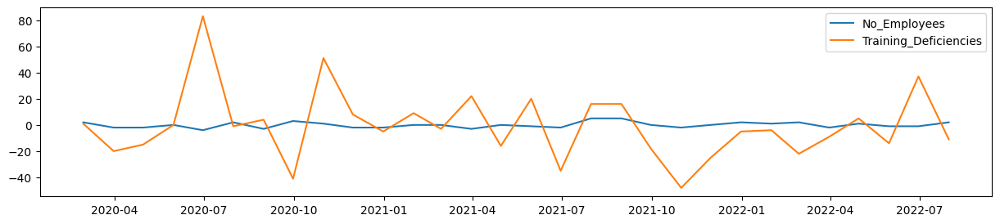

In [25]:
plt.rcParams['figure.figsize'] = 15, 3
plt.plot(diff_df['No_Employees'], label='No_Employees')
plt.plot(diff_df['Training_Deficiencies'], label='Training_Deficiencies')
plt.legend()
plt.show()

In [31]:
data = df[['No_Employees', 'Training_Deficiencies']]

In [124]:
train_lenght = int(len(df) * 0.8)

train = df[:train_lenght]
test = df[train_lenght:]

print(train.shape)
print(test.shape)

(24, 2)
(7, 2)


In [125]:
model = VAR(train, freq='ME')
sorted_order = model.select_order()

print(sorted_order.summary())

 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0       9.034       9.132       8382.       9.043
1       8.395       8.689       4459.       8.425
2       8.170       8.660       3661.       8.219
3       8.178       8.864       3953.       8.246
4       8.321       9.203       5223.       8.409
5       8.454       9.532       7679.       8.561
6       5.855       7.130      921.7*       5.982
7      4.930*      6.400*       1038.      5.076*
-------------------------------------------------


In [126]:
results = model.fit(2)

In [127]:
print(results.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Thu, 24, Apr, 2025
Time:                     19:32:13
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    8.59540
Nobs:                     22.0000    HQIC:                   8.21630
Log likelihood:          -141.527    FPE:                    3346.36
AIC:                      8.09947    Det(Omega_mle):         2221.73
--------------------------------------------------------------------
Results for equation No_Employees
                              coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------
const                           75.610034        30.830541            2.452           0.014
L1.No_Employees                  0.698327         0.227031            3.076           0.002
L1.Traini

In [128]:
lag = results.k_ar

predict = results.forecast(train.values[-lag:], steps=len(test))

predict

array([[129.18013958, 242.10859968],
       [128.24915635, 248.10675963],
       [127.17992802, 239.83693625],
       [126.76120834, 239.6913707 ],
       [126.79867743, 249.31438376],
       [126.75779787, 257.51563608],
       [126.49870656, 258.89447241]])

In [129]:
train.values[-lag:]

array([[127, 213],
       [129, 208]], dtype=int64)

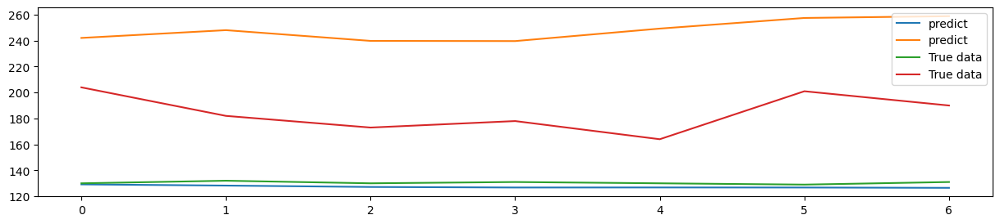

In [130]:
plt.plot(predict, label='predict')
plt.plot(test.values, label='True data')
plt.legend()
plt.show()

In [131]:
df_compared = pd.DataFrame(test)

df_compared[['Predict_No_Employees', 'Predict_Training']] = predict

In [132]:
print(f"{mean_absolute_error(df_compared['No_Employees'], df_compared['Predict_No_Employees']) = } \n")

print(f"{mean_absolute_error(df_compared['Training_Deficiencies'], df_compared['Predict_Training']) = }")

mean_absolute_error(df_compared['No_Employees'], df_compared['Predict_No_Employees']) = 3.082055121485429 

mean_absolute_error(df_compared['Training_Deficiencies'], df_compared['Predict_Training']) = 63.35259407386804


In [133]:
train.tail()

,No_Employees,Training_Deficiencies
date,,
2021-08-31,129,304
2021-09-30,129,286
2021-10-31,127,238
2021-11-30,127,213
2021-12-31,129,208


In [134]:
df_compared

,No_Employees,Training_Deficiencies,Predict_No_Employees,Predict_Training
date,,,,
2022-01-31,130,204,129.180140,242.108600
2022-02-28,132,182,128.249156,248.106760
2022-03-31,130,173,127.179928,239.836936
2022-04-30,131,178,126.761208,239.691371
2022-05-31,130,164,126.798677,249.314384
2022-06-30,129,201,126.757798,257.515636
2022-07-31,131,190,126.498707,258.894472


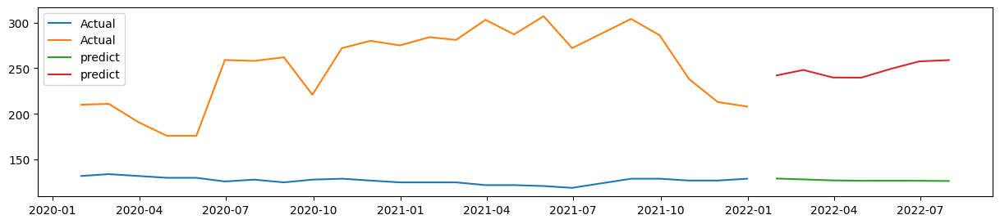

In [135]:
plt.plot(train, label='Actual')
plt.plot(df_compared[['Predict_No_Employees', 'Predict_Training']], label='predict') 
plt.legend()
plt.show()

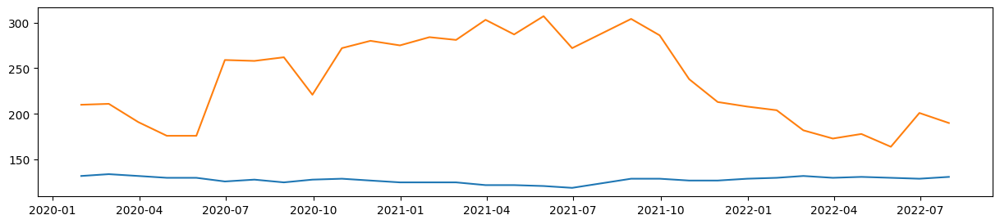

In [136]:
plt.plot(data) 
plt.show()

----------------

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [73]:
data = pd.read_csv('cardox.csv', date_format='mixed')
data

,date,value
0,1958-03-01,315.71
1,1958-04-01,317.45
2,1958-05-01,317.50
3,1958-06-01,317.10
4,1958-07-01,315.86
...,...,...
724,2018-07-01,408.71
725,2018-08-01,406.99
726,2018-09-01,405.51
727,2018-10-01,406.00


In [16]:
df = pd.read_csv('Analyse_Training.csv')

date = pd.date_range(start='2025-01-20', end='2027-08-20',  freq='ME')

In [17]:
df['date'] = date

In [20]:
df['date'] = pd.to_datetime(df['date'], format='mixed')

In [22]:
df.index = df['date']

In [32]:
last_values = df.iloc[-1].values

In [127]:
from statsmodels.tsa.api import VAR, VARMAX


model_var = VAR(df, freq='ME')

lag_order_results = model_var.select_order()
print(lag_order_results.summary())

best_lag = lag_order_results.selected_orders['bic']
print("Best lag by BIC:", best_lag)

 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0       9.733       9.833   1.687e+04       9.757
1       7.839       8.136       2545.       7.909
2       7.740       8.236       2336.       7.857
3       7.886       8.580       2783.       8.049
4       7.642       8.534       2306.       7.852
5       7.857       8.948       3147.       8.114
6       6.672       7.961       1124.       6.975
7       6.684       8.172       1460.       7.034
8       6.474       8.160       1792.       6.871
9      4.640*      6.525*      611.2*      5.084*
-------------------------------------------------
Best lag by BIC: 9


In [129]:
lag = best_lag

result_var = model_var.fit(maxlags=lag)

In [130]:
forecast = result_var.forecast(df.values[-lag:], steps=12)

In [131]:
forecast_date = pd.date_range(start='2027-08-31', end='2028-07-31', freq='ME')

In [132]:
forecast_date.shape

(12,)

In [133]:
forecast_df = pd.DataFrame(forecast, index=forecast_date)

forecast_df.columns = ['No_Employees', 'Training_Deficiencies']

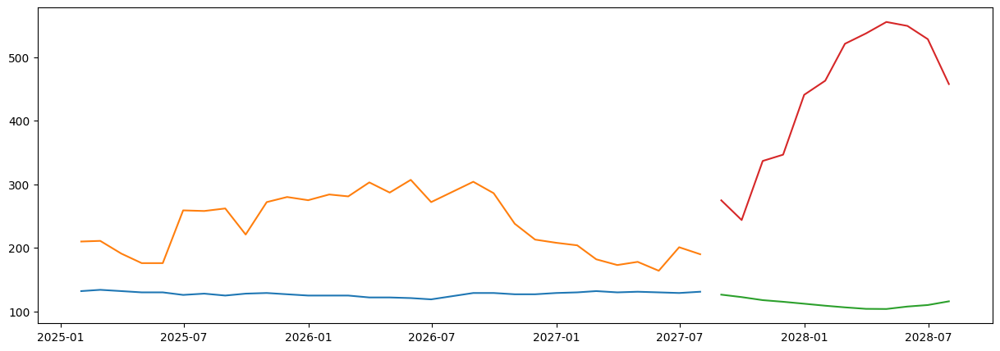

In [134]:
plt.rcParams['figure.figsize'] = 15, 5
plt.plot(df, label='Actual')
plt.plot(forecast_df, label='Predict')
plt.show()

--------------

In [138]:
def create_lagged_data(data, lags):
    df_lagged = data.shift(lags)
    df_combined = pd.concat([data, df_lagged], axis=1)
    df_combined.columns = ['y1', 'y2', 'y1_lag1', 'y2_lag1']
    return df_combined.dropna()

In [140]:
data_lagged = create_lagged_data(df, 1)

In [144]:
data_lagged.head()

,y1,y2,y1_lag1,y2_lag1
date,,,,
2025-02-28,134,211,132.0,210.0
2025-03-31,132,191,134.0,211.0
2025-04-30,130,176,132.0,191.0
2025-05-31,130,176,130.0,176.0
2025-06-30,126,259,130.0,176.0


In [156]:
from sklearn.linear_model import LinearRegression

X = data_lagged[['y1_lag1', 'y2_lag1']]

y_1, y_2 = data_lagged['y1'], data_lagged['y2']


model_y1 = LinearRegression().fit(X.values, y_1)
model_y2 = LinearRegression().fit(X.values, y_2)

In [157]:
last_row = df.iloc[-1:].values

y1_pred = model_y1.predict(last_row)
y2_pred = model_y2.predict(last_row)

In [168]:
print(f'y1 predict {y1_pred[0]}\ny2 predict {y2_pred[0]}')

y1 predict 130.5494458389898
y2 predict 194.29147680892123


------------------

In [74]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('Analyse_Training.csv')

date = pd.date_range(start='2025-01-20', end='2027-08-20', freq='ME')
df.index = date

In [77]:
df.columns = ['Y1', 'Y2']

In [28]:
import numpy as np
import pandas as pd

##### algoritm VAR 

def manual_var_one_lag(data):

    if data.shape[1] != 2:
        raise ValueError("DataFrame must be 2d dimension (two time series).")

    y1 = data.iloc[:, 0].values
    y2 = data.iloc[:, 1].values
    T = len(y1)

    # prepere data
    y1_t = y1[1:]
    y2_t = y2[1:]
    y1_lag1 = y1[:-1]
    y2_lag1 = y2[:-1]

    # Regressor matrix X (same for both equations)
    X = np.column_stack([np.ones(T - 1), y1_lag1, y2_lag1])

    # Estimating the coefficients for the first equation (y1_t = c1 + a11*y1_lag1 + a12*y2_lag1)
    Y1 = y1_t.reshape(-1, 1)
    beta1 = np.linalg.inv(X.T @ X) @ X.T @ Y1
    c1 = beta1[0, 0]
    a11 = beta1[1, 0]
    a12 = beta1[2, 0]

    # Estimating the coefficients for second equation(y2_t = c2 + a21*y1_lag1 + a22*y2_lag1)
    Y2 = y2_t.reshape(-1, 1)
    beta2 = np.linalg.inv(X.T @ X) @ X.T @ Y2
    c2 = beta2[0, 0]
    a21 = beta2[1, 0]
    a22 = beta2[2, 0]

    # Calculating residuals
    residuals1 = y1_t - (c1 + a11 * y1_lag1 + a12 * y2_lag1)
    residuals2 = y2_t - (c2 + a21 * y1_lag1 + a22 * y2_lag1)
    residuals = np.column_stack([residuals1, residuals2])

    # Estimating the cov matrix residuals 
    Sigma_u = (residuals.T @ residuals) / (T - 1 - 3)  # T-1 спостережень, 3 параметри в кожному рівнянні

    return {
        'coefficients': {
            'c': np.array([[c1], [c2]]),
            'A1': np.array([[a11, a12], [a21, a22]])
        },
        'sigma_u': Sigma_u
    }


results = manual_var_one_lag(df)

print("Estimated coefficent :")
print("Constant (c):\n", results['coefficients']['c'])
print("Matrix A1:\n", results['coefficients']['A1'])
print("\nCovariance matrix of residuals (Sigma_u):\n", results['sigma_u'])

# Predicted 1 step forward
last_y1 = df['Y1'].iloc[-1]
last_y2 = df['Y2'].iloc[-1]

forecast_y1 = results['coefficients']['c'][0, 0] + \
              results['coefficients']['A1'][0, 0] * last_y1 + \
              results['coefficients']['A1'][0, 1] * last_y2

forecast_y2 = results['coefficients']['c'][1, 0] + \
              results['coefficients']['A1'][1, 0] * last_y1 + \
              results['coefficients']['A1'][1, 1] * last_y2
 
print("\nPredicted 1 step forward:")
print(f"Прогноз Y1(t+1): {forecast_y1:.4f}")
print(f"Прогноз Y2(t+1): {forecast_y2:.4f}")

Estimated coefficent :
Constant (c):
 [[ 52.9283264 ]
 [492.59235539]]
Matrix A1:
 [[ 0.61900489 -0.01825538]
 [-3.24863058  0.66984067]]

Covariance matrix of residuals (Sigma_u):
 [[  4.48091045 -14.09497198]
 [-14.09497198 636.16781509]]

Predicted 1 step forward:
Прогноз Y1(t+1): 130.5494
Прогноз Y2(t+1): 194.2915


In [79]:
df.index = pd.to_datetime(df.index, format='mixed')

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31 entries, 2025-01-31 to 2027-07-31
Freq: ME
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Y1      31 non-null     int64
 1   Y2      31 non-null     int64
dtypes: int64(2)
memory usage: 744.0 bytes


--------------------------

In [2]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from adtk.visualization import plot

df = pd.read_csv('Analyse_Training.csv')

date = pd.date_range(start='2025-01-20', end='2027-08-20', freq='ME')
df.index = date

In [8]:
df.head()

,No_Employees,Training_Deficiencies
2025-01-31,132,210
2025-02-28,134,211
2025-03-31,132,191
2025-04-30,130,176
2025-05-31,130,176


In [11]:
std_Y1 = df.iloc[:, 0].std()
mean_Y1 = df.iloc[:, 0].mean()

high = mean_Y1 + std_Y1
low = mean_Y1 - std_Y1

anomalies = (df.iloc[:, 0] > high) | (df.iloc[:, 0] < low)

In [73]:
std_Y1_2 = df.iloc[:, 1].std()
mean_Y1_2 = df.iloc[:, 1].mean()

high_2 = mean_Y1_2 + std_Y1_2
low_2 = mean_Y1_2 - std_Y1_2

anomalies_2 = (df.iloc[:, 1] > high_2) | (df.iloc[:, 1] < low_2)

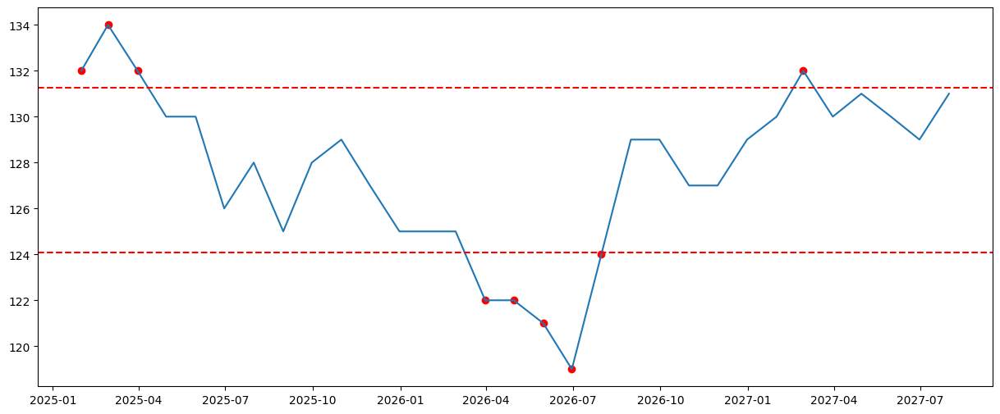

In [18]:
plt.figure(figsize=(15, 6))
plt.plot(df.iloc[:, 0])
plt.axhline(y=high, color='red', linestyle='--')
plt.axhline(y=low, color='red', linestyle='--')
plt.scatter(df.index[anomalies], df.iloc[:, 0][anomalies], color='red')
plt.show()

------------

In [81]:
std_Y2 = df.iloc[:, 1].std()
mean_Y2 = df.iloc[:, 1].mean()

high_Y2 = mean_Y2 + std_Y2
low_Y2 = mean_Y2 - std_Y2

anomalies_Y2 = (df.iloc[:, 1] > high_Y2) | (df.iloc[:, 1] < low_Y2)

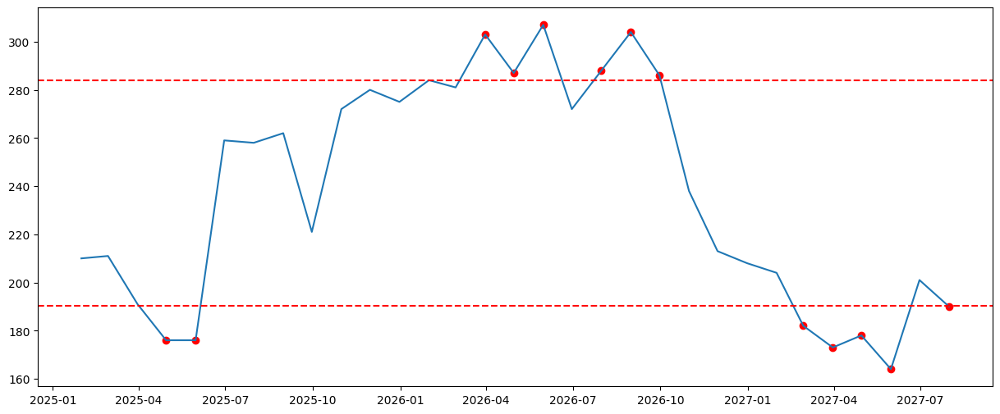

In [85]:
plt.figure(figsize=(15, 6))
plt.plot(df.iloc[:, 1])
plt.axhline(y=high_Y2, color='red', linestyle='--')
plt.axhline(y=low_Y2, color='red', linestyle='--')
plt.scatter(df.index[anomalies_Y2], df.iloc[:, 1][anomalies_Y2], color='red')
plt.show()